In [3]:
import sys
print(sys.executable)

/workspace/myenv/bin/python


In [ ]:
!nvidia-smi

Thu Nov 20 13:13:02 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA H100 80GB HBM3          On  |   00000000:CB:00.0 Off |                    0 |
| N/A   34C    P0             71W /  700W |       1MiB /  81559MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [6]:
!/workspace/myenv/bin/python -m pip install torch==2.3.1 torchvision==0.18.1 --index-url https://download.pytorch.org/whl/cu121


Looking in indexes: https://download.pytorch.org/whl/cu121

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


In [7]:
!/workspace/myenv/bin/python -m pip install accelerate==1.6.0


[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


In [8]:
!/workspace/myenv/bin/python -m pip install diffusers==0.32.2
!/workspace/myenv/bin/python -m pip install transformers==4.49.0
!/workspace/myenv/bin/python -m pip install safetensors einops opencv-python-headless pillow



[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


In [9]:
import torch, torchvision, accelerate, diffusers, transformers

print("torch:", torch.__version__)
print("torchvision:", torchvision.__version__)
print("accelerate:", accelerate.__version__)
print("diffusers:", diffusers.__version__)
print("transformers:", transformers.__version__)


torch: 2.3.1+cu121
torchvision: 0.18.1+cu121
accelerate: 1.6.0
diffusers: 0.32.2
transformers: 4.49.0


In [10]:
!/workspace/myenv/bin/python -m pip install huggingface-hub


[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


In [11]:
!/workspace/myenv/bin/python -m pip install ipywidgets


[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


In [12]:
from huggingface_hub import login
login()

In [13]:
from huggingface_hub import snapshot_download

snapshot_download(
    repo_id="black-forest-labs/FLUX.1-dev",
    local_dir="/workspace/FLUX.1-dev",
    local_dir_use_symlinks=False,
    revision="main"
)


/workspace/myenv/lib/python3.11/site-packages/huggingface_hub/file_download.py:979: UserWarning: `local_dir_use_symlinks` parameter is deprecated and will be ignored. The process to download files to a local folder has been updated and do not rely on symlinks anymore. You only need to pass a destination folder as`local_dir`.
For more details, check out https://huggingface.co/docs/huggingface_hub/main/en/guides/download#download-files-to-local-folder.
  warnings.warn(


Fetching 29 files:   0%|          | 0/29 [00:00<?, ?it/s]

'/workspace/FLUX.1-dev'

In [14]:
init_mode = 0
model_path = "/workspace/FLUX.1-dev"
use_interpolate = True
height = 1024
width = 1024
seed = 2025

import copy
import torch
import numpy as np
from PIL import Image

from models.attention_processor_characonsist import (
    reset_attn_processor,
    set_text_len,
    reset_size,
)
from models.pipeline_characonsist import CharaConsistPipeline

In [15]:
def init_model_mode_0():
    pipe = CharaConsistPipeline.from_pretrained(model_path, torch_dtype=torch.bfloat16)
    pipe.to("cuda:0")
    return pipe

def init_model_mode_1():
    pipe = CharaConsistPipeline.from_pretrained(model_path, torch_dtype=torch.bfloat16)
    pipe.enable_model_cpu_offload()
    return pipe

def init_model_mode_2():
    from diffusers import FluxTransformer2DModel
    from transformers import T5EncoderModel
    transformer = FluxTransformer2DModel.from_pretrained(
        model_path, subfolder="transformer", torch_dtype=torch.bfloat16, device_map="balanced")
    text_encoder_2 = T5EncoderModel.from_pretrained(
        model_path, subfolder="text_encoder_2", torch_dtype=torch.bfloat16, device_map="balanced")
    pipe = CharaConsistPipeline.from_pretrained(
        model_path, 
        transformer=transformer,
        text_encoder_2=text_encoder_2,
        torch_dtype=torch.bfloat16, 
        device_map="balanced")
    return pipe

def init_model_mode_3():
    pipe = CharaConsistPipeline.from_pretrained(model_path, torch_dtype=torch.bfloat16)
    pipe.enable_sequential_cpu_offload()
    return pipe


MODEL_INIT_FUNCS = {
    0: init_model_mode_0,
    1: init_model_mode_1,
    2: init_model_mode_2,
    3: init_model_mode_3
}

In [16]:
!/workspace/myenv/bin/python -m pip install protobuf==4.25.3
!/workspace/myenv/bin/python -m pip install sentencepiece



[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


In [17]:
!/workspace/myenv/bin/python -m pip install sentencepiece protobuf 


[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


In [ ]:
def get_text_tokens_length(pipe, p):
    text_mask = pipe.tokenizer_2(
        p,
        padding="max_length",
        max_length=512,
        truncation=True,
        return_length=False,
        return_overflowing_tokens=False,
        return_tensors="pt",
    ).attention_mask
    return text_mask.sum().item() - 1

def modify_prompt_and_get_length(bg, fg, act, pipe):
    bg += " "
    fg += " "
    prompt = bg + fg + act
    return prompt, get_text_tokens_length(pipe, bg), get_text_tokens_length(pipe, prompt)


from examples.example_prompts import fg_prompt, bg_act_prompts

pipe = MODEL_INIT_FUNCS[init_mode]()
reset_attn_processor(pipe, size=(height//16, width//16))

prompts, bg_lens, real_lens, meta_info = [], [], [], []
for scene in bg_act_prompts:
    for act_ind, act_prompt in enumerate(scene["act"]):
        prompt, bg_len, real_len = modify_prompt_and_get_length(copy.deepcopy(scene["bg"]), copy.deepcopy(fg_prompt), act_prompt, pipe)
        prompts.append(prompt)
        bg_lens.append(bg_len)
        real_lens.append(real_len)
        meta_info.append(dict(
            height = scene.get("height", height),
            width = scene.get("width", width),
            update_bg = (act_ind == 0)
        ))

print("#" * 50)
print(f"all prompts:")

for p in prompts:
    print(p)
print(f"background prompts tokens length: {bg_lens}")
print(f"entire prompts tokens length: {real_lens}")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

reset attn processor of layer single_transformer_blocks.0.attn.processor
reset attn processor of layer single_transformer_blocks.1.attn.processor
reset attn processor of layer single_transformer_blocks.2.attn.processor
reset attn processor of layer single_transformer_blocks.3.attn.processor
reset attn processor of layer single_transformer_blocks.4.attn.processor
reset attn processor of layer single_transformer_blocks.5.attn.processor
reset attn processor of layer single_transformer_blocks.6.attn.processor
reset attn processor of layer single_transformer_blocks.7.attn.processor
reset attn processor of layer single_transformer_blocks.8.attn.processor
reset attn processor of layer single_transformer_blocks.9.attn.processor
reset attn processor of layer single_transformer_blocks.10.attn.processor
reset attn processor of layer single_transformer_blocks.11.attn.processor
reset attn processor of layer single_transformer_blocks.12.attn.processor
reset attn processor of layer single_transformer

In [ ]:
import sentencepiece
print(f"Sentencepiece version: {sentencepiece.__version__}")

Sentencepiece version: 0.2.1


Token indices sequence length is longer than the specified maximum sequence length for this model (80 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['her backpack straps']


##################################################
Generating ID image ...
38 layers' background and real text length have been reset to 22 and 86.


  0%|          | 0/50 [00:00<?, ?it/s]

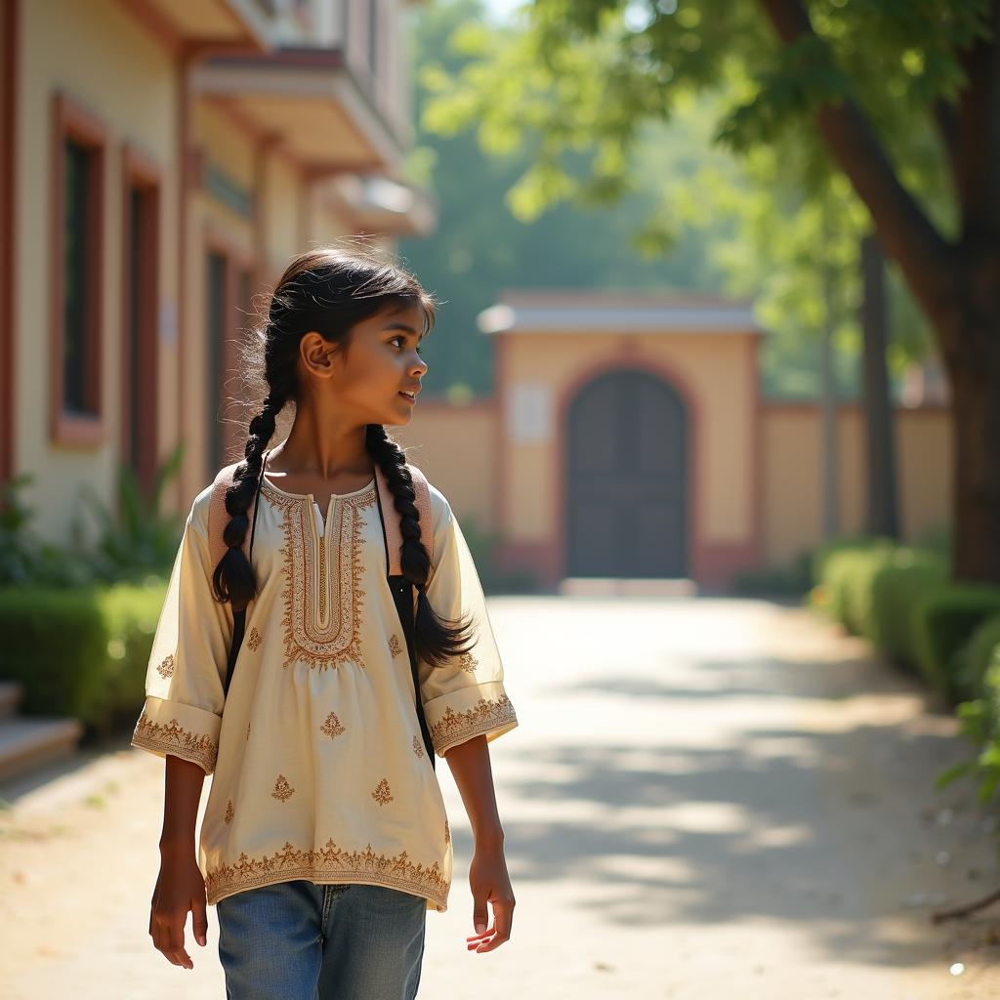

In [20]:
share_bg = True

pipe_kwargs = dict(
    height=height,
    width=width,
    use_interpolate=use_interpolate,
    share_bg=share_bg
)

id_prompt = prompts[0]
frm_prompts = prompts[1:]

print("#" * 50)
print("Generating ID image ...")
set_text_len(pipe, bg_lens[0], real_lens[0])
pipe_kwargs.update(meta_info[0])
reset_size(pipe, meta_info[0]["height"], meta_info[0]["width"])
id_images, id_spatial_kwargs = pipe(
    id_prompt, is_id=True, generator=torch.Generator("cpu").manual_seed(seed), **pipe_kwargs)
id_images[0]

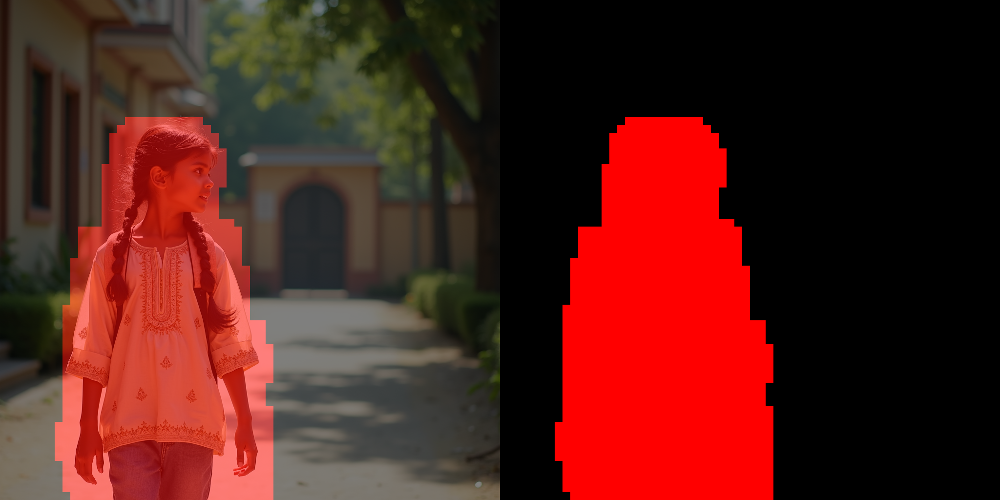

In [21]:
def overlay_mask_on_image(image, mask, color):
    img_array = np.array(image).astype(np.float32) * 0.5
    mask_zero = np.zeros_like(img_array)

    mask_resized = Image.fromarray(mask.astype(np.uint8)).resize(image.size, Image.NEAREST)
    mask_resized = np.array(mask_resized)[:, :, None]
    color = np.array(color, dtype=np.float32).reshape(1, 1, -1)
    mask_resized_color = mask_resized * color
    img_array = img_array + mask_resized_color * 0.5
    mask_zero = mask_zero + mask_resized_color
    out_img = np.concatenate([img_array, mask_zero], axis=1)
    out_img[out_img > 255] = 255
    out_img = out_img.astype(np.uint8)
    return Image.fromarray(out_img)

overlay_mask_on_image(id_images[0], id_spatial_kwargs["curr_fg_mask"][0].cpu().numpy(), (255, 0, 0))

##################################################
Generating frame images ...
38 layers' background and real text length have been reset to 22 and 84.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

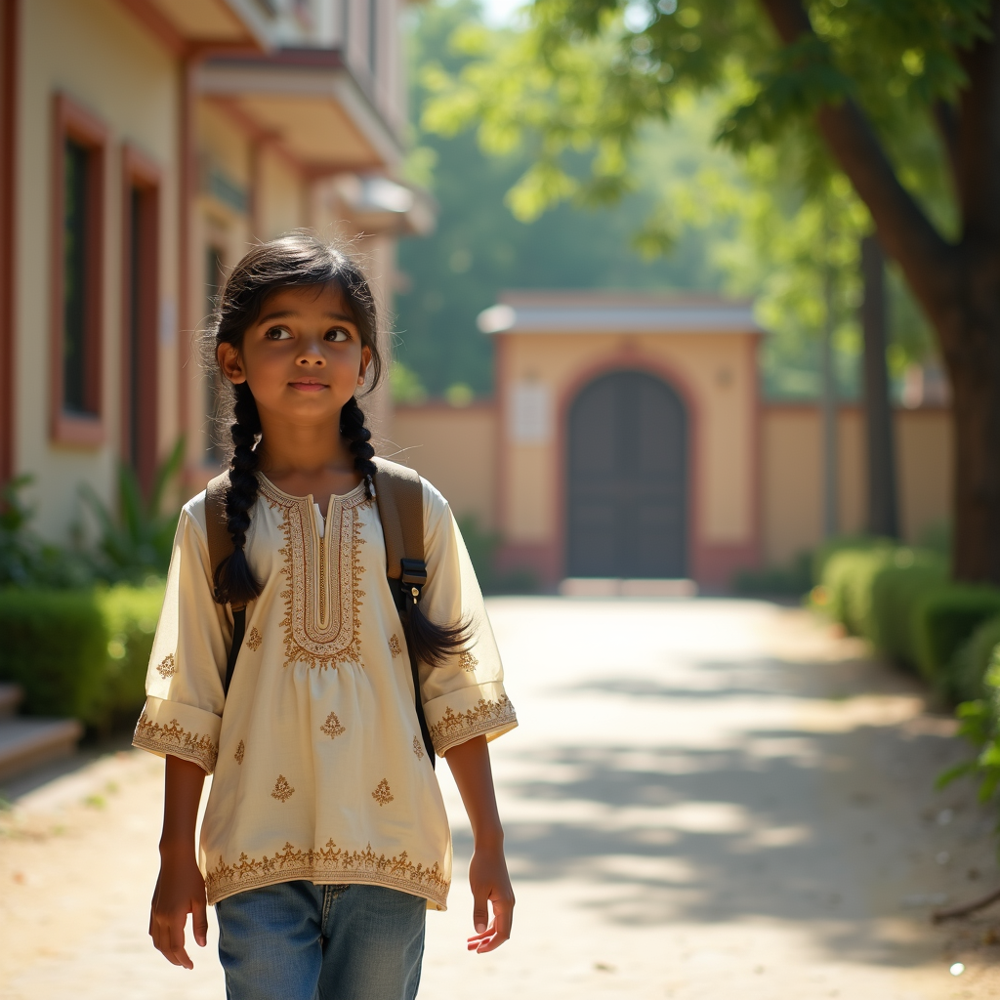

38 layers' background and real text length have been reset to 18 and 80.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

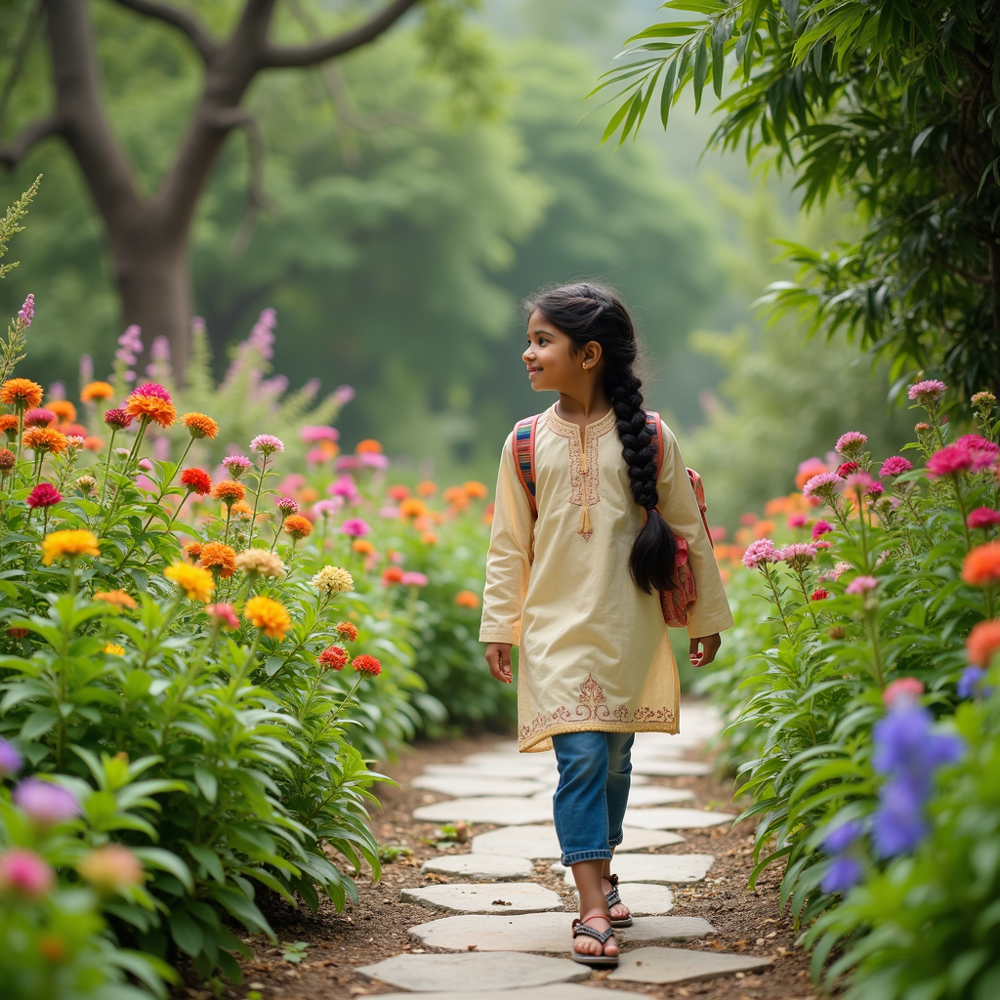

38 layers' background and real text length have been reset to 18 and 79.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

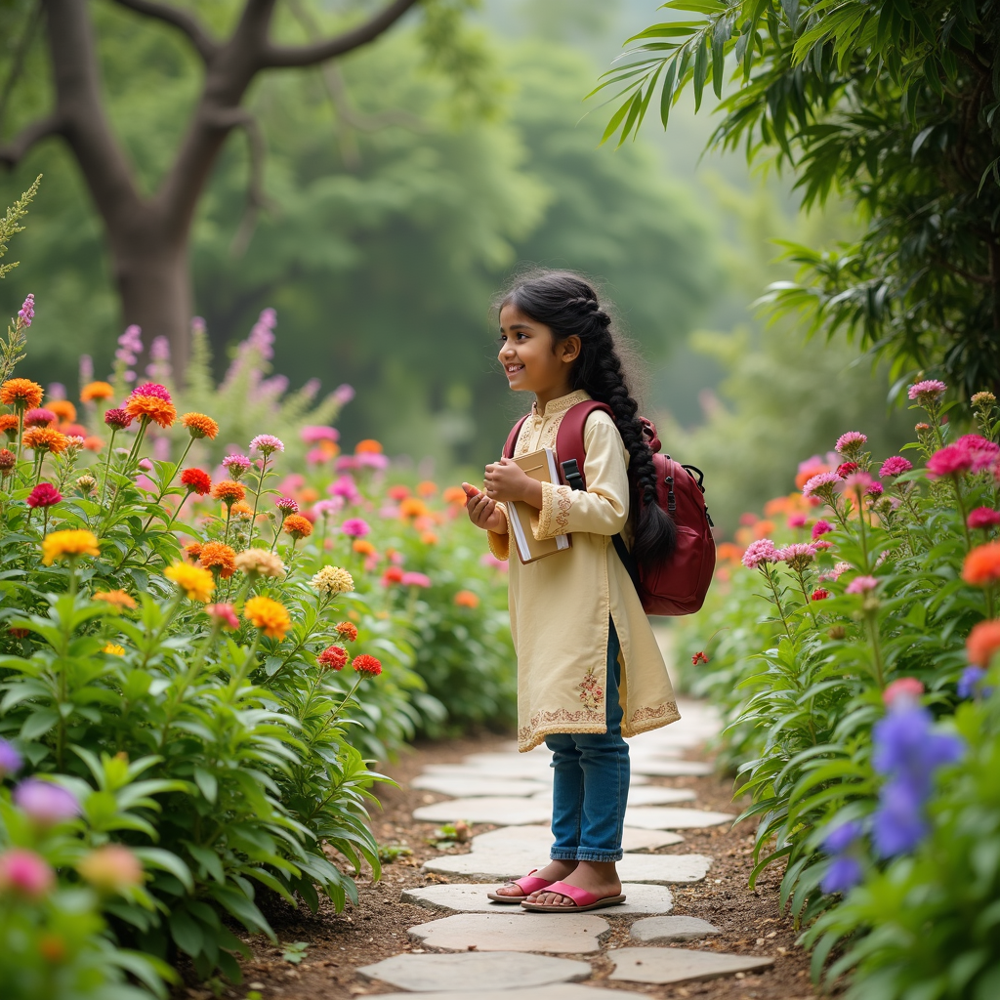

38 layers' background and real text length have been reset to 18 and 81.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

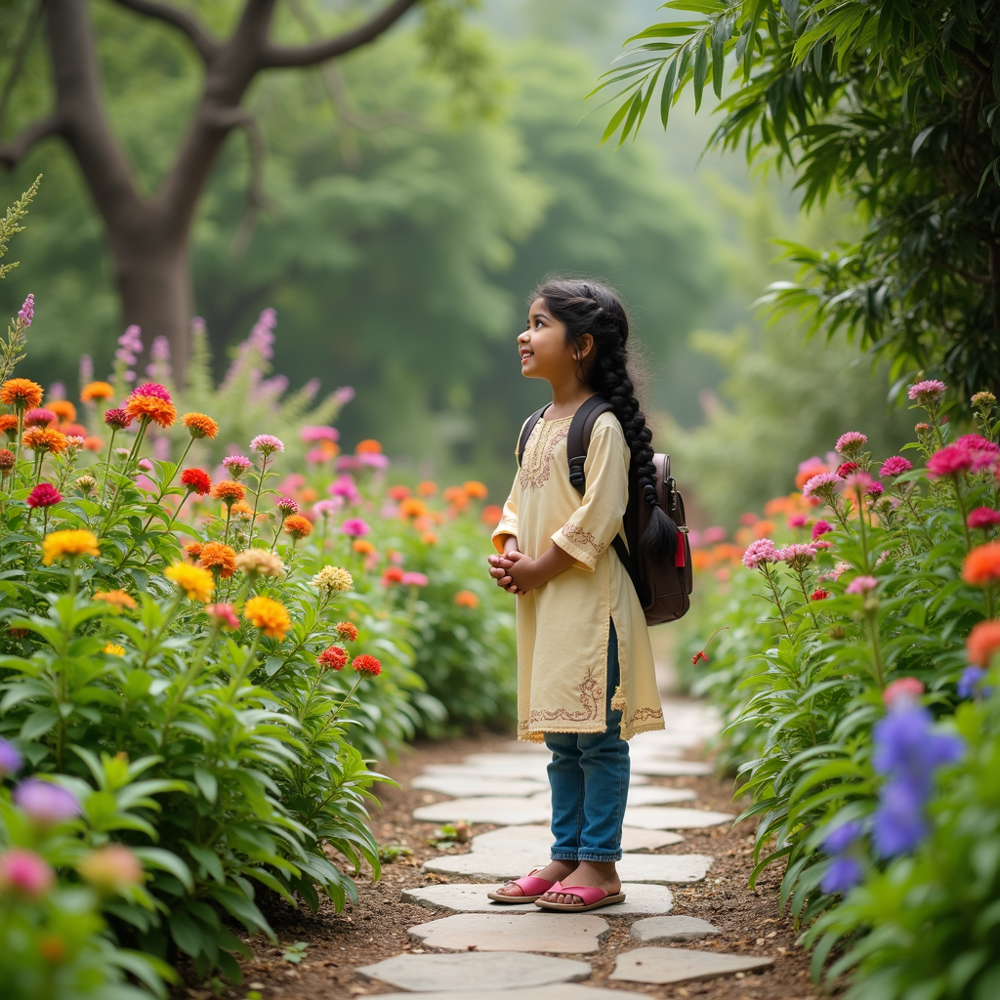

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['surprise and excitement, front view']


38 layers' background and real text length have been reset to 31 and 94.


  0%|          | 0/50 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['surprise and excitement, front view']


  0%|          | 0/50 [00:00<?, ?it/s]

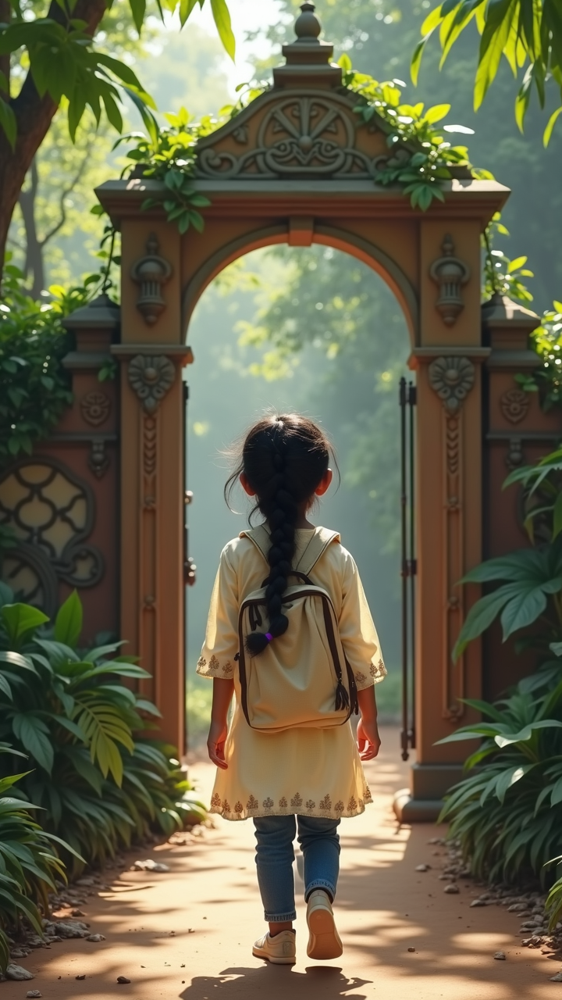

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['inside with curiosity, side view']


38 layers' background and real text length have been reset to 31 and 94.


  0%|          | 0/50 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['inside with curiosity, side view']


  0%|          | 0/50 [00:00<?, ?it/s]

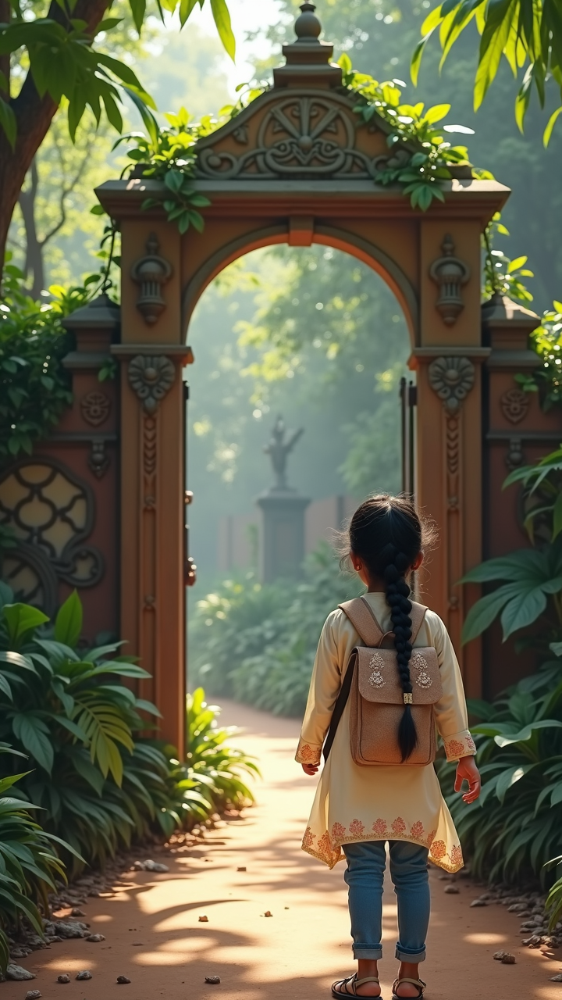

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', front view']


38 layers' background and real text length have been reset to 36 and 99.


  0%|          | 0/50 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', front view']


  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
from IPython.display import display

spatial_kwargs = dict(id_fg_mask=id_spatial_kwargs["curr_fg_mask"], id_bg_mask=~id_spatial_kwargs["curr_fg_mask"])

print("#" * 50)
print("Generating frame images ...")
all_images = []
for ind, prompt in enumerate(frm_prompts):
    pipe_kwargs.update(meta_info[1:][ind])
    reset_size(pipe, meta_info[1:][ind]["height"], meta_info[1:][ind]["width"])
    set_text_len(pipe, bg_lens[1:][ind], real_lens[1:][ind])
    _, spatial_kwargs = pipe(
        prompt, is_pre_run=True, generator=torch.Generator("cpu").manual_seed(seed), spatial_kwargs=spatial_kwargs, **pipe_kwargs)
    images, spatial_kwargs = pipe(
        prompt, generator=torch.Generator("cpu").manual_seed(seed), spatial_kwargs=spatial_kwargs, **pipe_kwargs)
    display(images[0])
